### Работа в kaggle (в google colab мало времение на использование GPU) 
***

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2
from glob import glob
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras import Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, UpSampling2D, Input, Concatenate
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Dropout, BatchNormalization, Activation
from tensorflow.keras.models import Model
import kagglehub

#### Загрузка данных
***

In [2]:
# Загрузка датасета
path = kagglehub.dataset_download("nikhilroxtomar/person-segmentation")
print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/person-segmentation


In [3]:
# Загрузка изображений
image_folder = "/kaggle/input/person-segmentation/people_segmentation/images"
image_paths = [os.path.join(image_folder, img) for img in sorted(os.listdir(image_folder)) if img.endswith(".jpg")]

# Загрузка масок
mask_folder = "/kaggle/input/person-segmentation/people_segmentation/masks"
mask_paths = [os.path.join(mask_folder, mask) for mask in sorted(os.listdir(mask_folder)) if mask.endswith(".png")]

In [4]:
# Разделение данных на обучающую и тестовую выборку
train_images, test_images, train_masks, test_masks = train_test_split(image_paths, mask_paths, test_size=0.2, random_state=42)

### Чтение изображений и масок
***

In [5]:
def read_image(path, target_size=(256, 256)):
    
    # Загружаем изображение в цветном формате (BGR) по указанному пути
    x = cv2.imread(path, cv2.IMREAD_COLOR)
    
    # Меняем цветовое пространство с BGR на RGB
    x = cv2.cvtColor(x, cv2.COLOR_BGR2RGB)
    
    # Изменяем размер изображения до указанного размера (по умолчанию 256x256)
    x = cv2.resize(x, target_size)
    
    # Нормализуем значения пикселей, деля на 255.0, чтобы диапазон был от 0 до 1
    x = x / 255.0
    
    # Приводим тип данных к np.float32 для совместимости с нейронными сетями
    x = x.astype(np.float32)
    
    return x  # Возвращаем обработанное изображение в формате (height, width, 3)


In [6]:
def read_mask(path, target_size=(256, 256)):
    
    # Загружаем маску в формате градаций серого (одноканальное изображение)
    x = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    
    # Изменяем размер маски до указанного размера (по умолчанию 256x256)
    x = cv2.resize(x, target_size)
    
    # Приводим данные к типу np.float32 и нормализуем значения пикселей, деля на 255.0
    # Это необходимо, чтобы значения пикселей были в диапазоне [0, 1]
    x = x.astype(np.float32) / 255.0  
    
    # Добавляем дополнительную размерность по каналу, чтобы маска имела форму (height, width, 1)
    x = np.expand_dims(x, axis=-1)
    
    # Возвращаем маску в формате (height, width, 1) для использования в нейронных сетях
    return x


In [7]:
# Вспомогательная функция для обработки изображения и маски
def process_image_and_mask(image_path, mask_path):
    # Декодируем пути из байтов в строки, чтобы получить корректные пути для файлов
    image_path = image_path.decode()  
    mask_path = mask_path.decode()  
    
    # Загружаем и обрабатываем изображение и маску, используя вспомогательные функции
    image = read_image(image_path)    # Чтение и преобразование изображения
    mask = read_mask(mask_path)       # Чтение и преобразование маски
    
    return image, mask

def preprocess(image_path, mask_path):
     # Используем tf.numpy_function для того, чтобы процесс загрузки и обработки данных
     # из process_image_and_mask мог быть вызван в рамках графа TensorFlow. 
    image, mask = tf.numpy_function(process_image_and_mask, [image_path, mask_path], [tf.float32, tf.float32])

    # Устанавливаем фиксированную форму (shape) для изображения (256x256x3 для RGB)
    image.set_shape([256, 256, 3])  
    
    # Устанавливаем фиксированную форму для маски (256x256x1 для одноцветной маски)
    mask.set_shape([256, 256, 1]) 
    
    return image, mask

In [8]:
def tf_dataset(images, masks, batch_size=8):
    # Создание tf.data.Dataset из списков путей к изображениям и маскам
    dataset = tf.data.Dataset.from_tensor_slices((images, masks))
    
    # Перемешивание данных перед обучением для улучшения обобщающей способности модели
    # buffer_size — количество элементов, которые будут храниться в памяти для случайного перемешивания
    # Это помогает создать более случайные выборки
    dataset = dataset.shuffle(buffer_size=5000)
    
    # Применение предварительной обработки данных (функция preprocess) к каждому элементу датасета
    # Каждый элемент датасета будет обработан функцией preprocess (например, изменение размера, нормализация)
    dataset = dataset.map(preprocess)
    
    # Разбиение данных на батчи. Размер батча можно настроить через параметр batch_size.
    # Батчи используются для пакетной обработки данных во время обучения модели
    dataset = dataset.batch(batch_size)
    
    # Prefetching позволяет загружать следующий батч данных в процессе обучения, минимизируя время ожидания
    # tf.data.experimental.AUTOTUNE позволяет TensorFlow автоматически выбирать количество потоков для предзагрузки данных
    dataset = dataset.prefetch(tf.data.experimental.AUTOTUNE)
    
    # Возвращаем подготовленный датасет
    return dataset


In [10]:
def show_image_and_mask(image_path, mask_path, target_size=(256, 256)):
    """
    Функция для отображения изображения и его маски рядом друг с другом.
    
    image_path: Путь к изображению.
    mask_path: Путь к маске.
    target_size: Размер для изменения изображений (по умолчанию 256x256).
    """
    
    # Чтение изображения и маски
    image = read_image(image_path, target_size)
    mask = read_mask(mask_path, target_size)

    # Настройка размера выводимого изображения
    plt.figure(figsize=(10, 5))

    # Отображение изображения
    plt.subplot(1, 2, 1)  # 1 строка, 2 колонки, первое изображение
    plt.imshow(image)  # Отображаем изображение
    plt.title('Image')
    plt.axis('off')  # Отключаем оси

    # Отображение маски
    plt.subplot(1, 2, 2)  # 1 строка, 2 колонки, второе изображение
    plt.imshow(mask.squeeze(), cmap='gray')  # Отображаем маску (сжимаем размерность для отображения)
    plt.title('Mask')
    plt.axis('off')  # Отключаем оси

    # Показываем результат
    plt.show()


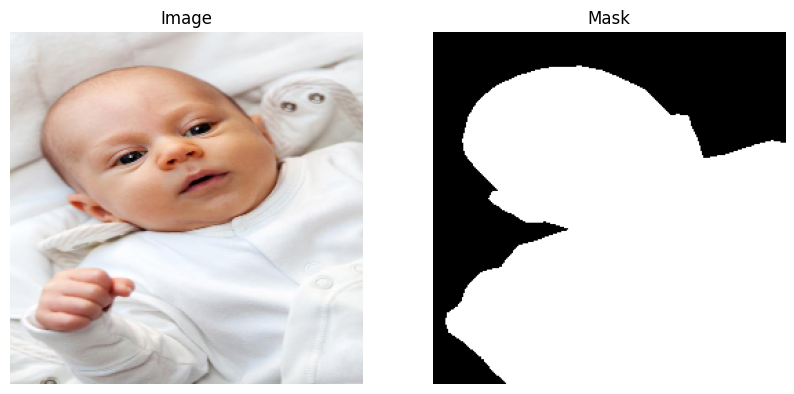

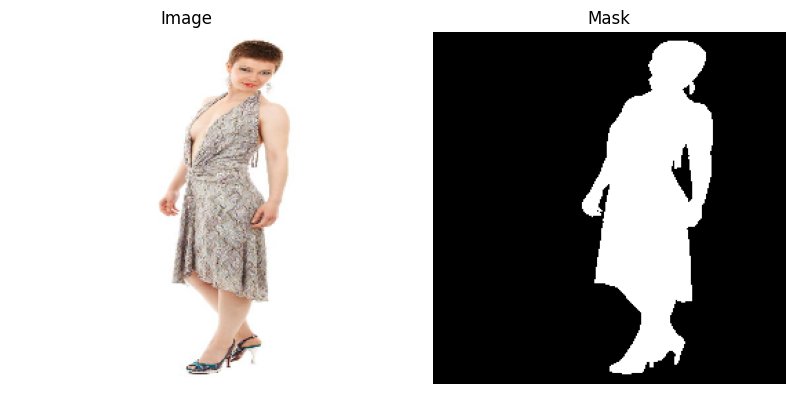

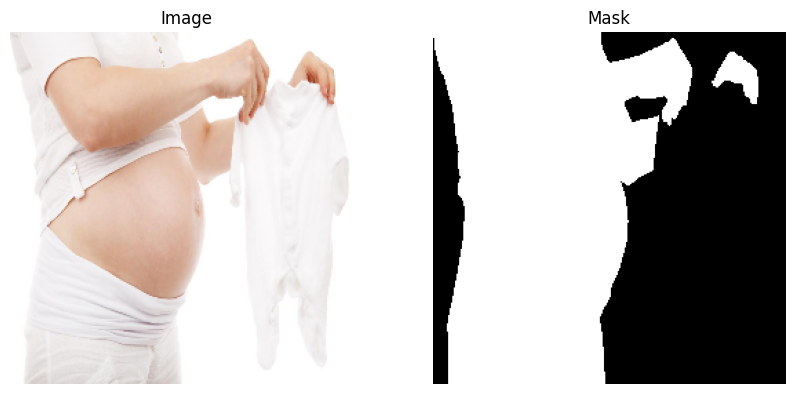

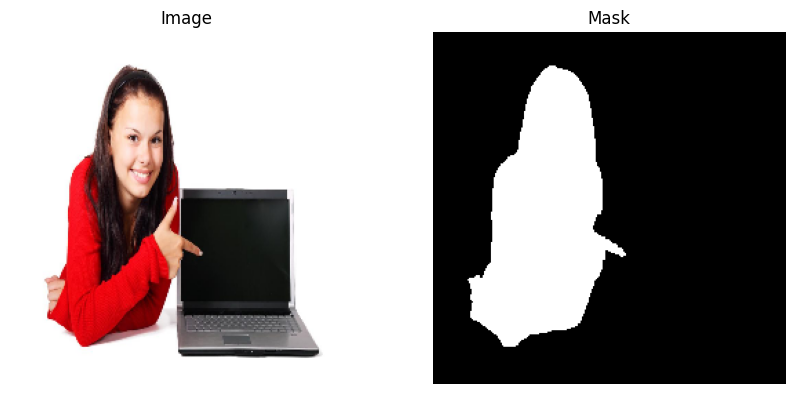

In [11]:
for i in range(6, 10):  # Отобразим изображения и маски с 6 по 9
    show_image_and_mask(image_paths[i], mask_paths[i])

### U-net
***
U-Net состоит из двух частей: Encoder (сжатие информации) и Decoder (восстановление пространственного разрешения). Каждый слой в архитектуре U-Net выполняет операции свертки и пуллинга для извлечения признаков, а затем восстанавливает разрешение изображения с использованием операций апсемплинга и объединения.

In [ ]:
def build_unet(input_shape=(256, 256, 3)):
    # Входной слой, принимающий изображения заданного размера (256x256, 3 канала)
    inputs = Input(input_shape)

    # Encoder - первый уровень (сжатие признаков)
    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)  # Применяем свертку с 64 фильтрами
    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(c1)       # Еще одна свертка для улучшения извлечения признаков
    p1 = MaxPooling2D((2, 2))(c1)  # Пуллинг для уменьшения пространственного размера (сжатие)

    # Encoder - второй уровень
    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(p1)  # Свертка с 128 фильтрами
    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(c2)  # Еще одна свертка
    p2 = MaxPooling2D((2, 2))(c2)  # Пуллинг для уменьшения размера

    # Encoder - третий уровень
    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(p2)  # Свертка с 256 фильтрами
    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(c3)  # Еще одна свертка
    p3 = MaxPooling2D((2, 2))(c3)  # Пуллинг для уменьшения размера

    # Encoder - четвертый уровень
    c4 = Conv2D(512, (3, 3), activation='relu', padding='same')(p3)  # Свертка с 512 фильтрами
    c4 = Conv2D(512, (3, 3), activation='relu', padding='same')(c4)  # Еще одна свертка
    p4 = MaxPooling2D(pool_size=(2, 2))(c4)  # Пуллинг для уменьшения размера

    # Bottleneck (середина сети, где извлекаются самые глубокие признаки)
    c5 = Conv2D(1024, (3, 3), activation='relu', padding='same')(p4)  # Свертка с 1024 фильтрами
    c5 = Conv2D(1024, (3, 3), activation='relu', padding='same')(c5)  # Еще одна свертка

    # Decoder - первый уровень (восстановление разрешения)
    u6 = UpSampling2D((2, 2))(c5)  # Апсемплинг для увеличения разрешения
    u6 = Concatenate()([u6, c4])   # Объединение с выходом из предыдущего слоя энкодера (skip connection)
    c6 = Conv2D(512, (3, 3), activation='relu', padding='same')(u6)  # Свертка с 512 фильтрами
    c6 = Conv2D(512, (3, 3), activation='relu', padding='same')(c6)  # Еще одна свертка

    # Decoder - второй уровень
    u7 = UpSampling2D((2, 2))(c6)  # Апсемплинг для увеличения разрешения
    u7 = Concatenate()([u7, c3])   # Объединение с выходом из предыдущего слоя энкодера
    c7 = Conv2D(256, (3, 3), activation='relu', padding='same')(u7)  # Свертка с 256 фильтрами
    c7 = Conv2D(256, (3, 3), activation='relu', padding='same')(c7)  # Еще одна свертка

    # Decoder - третий уровень
    u8 = UpSampling2D((2, 2))(c7)  # Апсемплинг для увеличения разрешения
    u8 = Concatenate()([u8, c2])   # Объединение с выходом из предыдущего слоя энкодера
    c8 = Conv2D(128, (3, 3), activation='relu', padding='same')(u8)  # Свертка с 128 фильтрами
    c8 = Conv2D(128, (3, 3), activation='relu', padding='same')(c8)  # Еще одна свертка

    # Decoder - четвертый уровень
    u9 = UpSampling2D((2, 2))(c8)  # Апсемплинг для увеличения разрешения
    u9 = Concatenate()([u9, c1])   # Объединение с выходом из предыдущего слоя энкодера
    c9 = Conv2D(64, (3, 3), activation='relu', padding='same')(u9)   # Свертка с 64 фильтрами
    c9 = Conv2D(64, (3, 3), activation='relu', padding='same')(c9)   # Еще одна свертка

    # Финальный слой: выходной слой с 1 каналом (для бинарной сегментации) и активацией 'sigmoid'
    outputs = Conv2D(1, (1, 1), activation='sigmoid')(c9)

    # Модель с входом и выходом
    model = Model(inputs, outputs, name="U-Net")
    
    # Возвращаем построенную модель
    return model


### Deeplab
***
DeepLab для сегментации изображений, использует предварительно обученную модель DenseNet121 в качестве основы (backbone).

In [ ]:
def build_deeplab(input_shape=(256, 256, 3), num_classes=1):
    # Загружаем предварительно обученную модель DenseNet121, без топового слоя (include_top=False)
    # Используем ImageNet веса для извлечения признаков из изображений
    base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=input_shape)
    
    # Входной слой подает данные в модель DenseNet121, а base_model.output возвращает последний слой base модели
    x = base_model.output
    
    # Далее мы увеличиваем разрешение карты признаков с помощью сверток и апсемплинга.
    # Эти операции служат для восстановления пространственного разрешения (upsampling).

    # Добавляем свертку с 512 фильтрами для извлечения более абстрактных признаков
    x = Conv2D(512, (3, 3), activation='relu', padding='same')(x)
    # Выполняем апсемплинг (увеличиваем разрешение на 2x)
    x = UpSampling2D((2, 2))(x)  # Увеличиваем размерность: (16, 16)

    # Добавляем свертку с 256 фильтрами
    x = Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    # Еще раз увеличиваем размерность
    x = UpSampling2D((2, 2))(x)  # Увеличиваем размерность: (32, 32)

    # Добавляем свертку с 128 фильтрами
    x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    # Еще один апсемплинг
    x = UpSampling2D((2, 2))(x)  # Увеличиваем размерность: (64, 64)

    # Добавляем свертку с 64 фильтрами
    x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    # Апсемплинг для увеличения разрешения
    x = UpSampling2D((2, 2))(x)  # Увеличиваем размерность: (128, 128)

    # Добавляем свертку с 32 фильтрами
    x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
    # Увеличиваем размерность до исходного размера (256, 256)
    x = UpSampling2D((2, 2))(x)  # Увеличиваем размерность: (256, 256)

    # Финальный слой, который возвращает маску
    # Используется свертка 1x1 для объединения всех каналов в один канал (или несколько, в зависимости от количества классов)
    # Активация 'sigmoid' позволяет получить вероятности для каждого пикселя (для бинарной или многоклассовой сегментации)
    outputs = Conv2D(num_classes, (1, 1), activation='sigmoid', padding='same')(x)

    # Создаем модель с входом из base_model и выходом через outputs
    model = Model(inputs=base_model.input, outputs=outputs)
    
    # Возвращаем модель
    return model


### Seg-net
***
SegNet — это архитектура нейронной сети для семантической сегментации, которая использует сверточные нейронные сети (CNN) для предсказания масок на основе входных изображений. Она состоит из двух частей: энкодера (сжатие и извлечение признаков) и декодера (восстановление разрешения изображения).

In [ ]:
# Функция для создания модели SegNet
def build_segnet(input_shape=(256, 256, 3), num_classes=1):
    # Входной слой модели с заданной формой входа (256x256x3 для RGB-изображений)
    inputs = Input(shape=input_shape)

    # Encoder (сжатие изображений, извлечение признаков)
    
    # Первый блок сверток (64 фильтра)
    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)  # Свертка с фильтрами 3x3
    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(c1)  # Еще одна свертка с такими же фильтрами
    p1 = MaxPooling2D((2, 2))(c1)  # Макс-пулинг для уменьшения разрешения (половина размера по обеим осям)

    # Второй блок сверток (128 фильтров)
    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(p1)
    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(c2)
    p2 = MaxPooling2D((2, 2))(c2)  # Еще один слой макс-пулинга

    # Третий блок сверток (256 фильтров)
    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(p2)
    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(c3)
    p3 = MaxPooling2D((2, 2))(c3)  # Еще один слой макс-пулинга

    # Decoder (восстановление изображения и увеличение разрешения)

    # Начинаем с увеличения разрешения и восстановления признаков из сжатого изображения.
    # Первый блок декодера
    u3 = UpSampling2D((2, 2))(p3)  # Апсемплинг для увеличения разрешения (в 2 раза)
    d3 = Conv2D(256, (3, 3), activation='relu', padding='same')(u3)  # Свертка для восстановления признаков
    d3 = Conv2D(256, (3, 3), activation='relu', padding='same')(d3)  # Еще одна свертка для улучшения признаков

    # Второй блок декодера
    u2 = UpSampling2D((2, 2))(d3)  # Апсемплинг для увеличения разрешения
    d2 = Conv2D(128, (3, 3), activation='relu', padding='same')(u2)  # Свертка для восстановления признаков
    d2 = Conv2D(128, (3, 3), activation='relu', padding='same')(d2)  # Еще одна свертка для улучшения признаков

    # Третий блок декодера
    u1 = UpSampling2D((2, 2))(d2)  # Апсемплинг для увеличения разрешения
    d1 = Conv2D(64, (3, 3), activation='relu', padding='same')(u1)  # Свертка для восстановления признаков
    d1 = Conv2D(64, (3, 3), activation='relu', padding='same')(d1)  # Еще одна свертка для улучшения признаков

    # Финальный слой свертки для получения маски сегментации
    # Используем активацию 'sigmoid' для получения вероятности для каждого пикселя
    outputs = Conv2D(num_classes, (1, 1), activation='sigmoid')(d1)  # Используем 1x1 свертку для получения маски
    
    # Создаем модель с входом и выходом
    model = Model(inputs, outputs, name="SegNet")
    
    # Возвращаем модель
    return model


### Функция обучения моделей
***

In [ ]:
# Функция для обучения модели
def train_model(model, train_dataset, val_dataset, epochs=10, model_name="model"):
    # Определяем метрики, которые будем отслеживать во время обучения
    metrics = [
        'accuracy',                # Общая точность модели
        MeanIoU(num_classes=2),    # Средний индекс IoU (Intersection over Union) для бинарной сегментации (num_classes=2)
        Recall(),                  # Точность по чувствительности (Recalls)
        Precision()        ]       # Точность по специфичности (Precision)

    # Компилируем модель
    model.compile(
        optimizer='adam',                # Оптимизатор Adam, хорошо подходящий для обучения нейросетей
        loss='binary_crossentropy',      # Функция потерь для бинарной классификации
        metrics=metrics                  # Метрики для оценки качества модели
    )

    # Проверяем наличие директории для сохранения моделей и метрик, создаем ее, если не существует
    if not os.path.exists("models"):
        os.makedirs("models")

    # Определяем колбэки:
    # - ModelCheckpoint: сохраняет модель после каждой эпохи, если улучшились метрики
    # - CSVLogger: сохраняет метрики в CSV файл для дальнейшего анализа

    model_checkpoint = ModelCheckpoint(
        os.path.join("models", f"{model_name}.keras"),  # Путь к файлу для сохранения модели
        monitor='val_loss',  # Мониторим значение валидационной функции потерь (val_loss)
        save_best_only=True, # Сохраняем модель только при улучшении метрики
        mode='min',          # Сохраняем модель при уменьшении значения метрики (для потерь)
        verbose=1             # Выводим информацию о процессе сохранения
    )
    
    csv_logger = CSVLogger(os.path.join("models", f"{model_name}_metrics.csv"))  # Логирование метрик в CSV файл

    # Обучаем модель
    model.fit(
        train_dataset,                # Обучающий датасет
        validation_data=val_dataset,  # Валидационный датасет
        epochs=epochs,                # Количество эпох для обучения
        callbacks=[model_checkpoint, csv_logger]  # Колбэки, чтобы сохранять модель и записывать метрики
    )

# Создание обучающих и валидационных датасетов
train_dataset = tf_dataset(train_images, train_masks, batch_size=8)
val_dataset = tf_dataset(test_images, test_masks, batch_size=8)


### Обучение моделей
***

In [ ]:
unet_model = build_unet()

print("Обучение U-Net модели...")
train_model(unet_model, train_dataset, val_dataset, epochs=10, model_name="unet_model")

In [ ]:
deeplab_model = build_deeplab()

print("Обучение Deeplab модели...")
train_model(deeplab_model, train_dataset, val_dataset, epochs=10, model_name="deeplab_model")

In [ ]:
segnet_model = build_segnet()
print("Обучение Segnet модели...")
train_model(segnet_model, train_dataset, val_dataset, epochs=10, model_name="segnet_model")

Далее происходит следующие действия:

1. Скачивание файлов из дирректории '/kaggle/working/models'.
2. Загрузка моделей в Input. В ноутбук можно загружать файлы только из дирректории 'Input'.
3. Создание нового датасета 'videos', добавление видео в датасет. В 'Input' возможно загружать только датасеты и модели.

После выполнения всех этих действий выглядит это так:

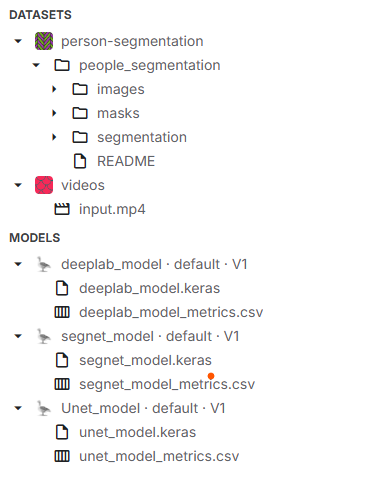

### Загрука полученных весов, а также сегментация видео
***

In [13]:
import cv2
import numpy as np
import tensorflow as tf
import time
from tensorflow.keras.models import load_model
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score

In [17]:
deeplab_model_path = "/kaggle/input/deeplab_model/tensorflow2/default/1/deeplab_model.keras"
deeplab_model = load_model(deeplab_model_path)

In [15]:
segnet_model_path = "/kaggle/input/segnet_model/tensorflow2/default/1/segnet_model.keras"
segnet_model = load_model(segnet_model_path)

In [16]:
unet_model_path = "/kaggle/input/unet_model/tensorflow2/default/1/unet_model.keras"
unet_model = load_model(unet_model_path)

### Функция для сегментации кадра и наложения его на фон

In [12]:
def segment_frame(model, frame, background_color, img_size=(256, 256)):
    """
    Эта функция использует модель для сегментации кадра, создаёт маску и накладывает сегментированный
    объект на фон заданного цвета.
    
    model: Обученная модель для сегментации.
    frame: Кадр (изображение) для сегментации.
    background_color: Цвет фона (в формате [B, G, R]), на который будет наложен сегментированный объект.
    img_size: Размер изображения для входа в модель (по умолчанию 256x256).
    """
    
    # Предобработка кадра для модели
    input_img = cv2.resize(frame, img_size) / 255.0            # Изменяем размер кадра и нормализуем значения пикселей
    input_img = np.expand_dims(input_img, axis=0)              # Добавляем размерность для батча, получая форму (1, height, width, 3)
    
    # Предсказание маски с помощью модели
    mask = model.predict(input_img)[0]                         # Получаем предсказанную маску для первого элемента батча
    mask = cv2.resize(mask, (frame.shape[1], frame.shape[0]))  # Масштабируем маску до оригинального размера кадра
    mask = (mask > 0.5).astype(np.uint8)                       # Применяем бинаризацию маски с порогом 0.5, делая её 0 или 1
    
    # Подготовка к наложению кадра на фон
    mask_rgb = np.stack([mask] * 3, axis=-1)                   # Преобразуем маску в трёхканальное RGB изображение
    background = np.full_like(frame, background_color)         # Создаём фон указанного цвета и такого же размера, как кадр
    
    # Накладываем сегментированный объект на фон: 
    # если маска равна 1, оставляем пиксели оригинального кадра, если 0 - подставляем фон
    segmented_frame = np.where(mask_rgb == 1, frame, background)
    
    return segmented_frame 


In [18]:
def process_video(input_path, output_name, model, background_color=(0, 0, 0), img_size=(256, 256)):
    """
    Функция для обработки видео, сегментации каждого кадра и записи результата в новое видео с указанным фоном.
    
    input_path: Путь к входному видеофайлу.
    output_name: Имя выходного видеофайла.
    model: Модель для сегментации, применяемая к каждому кадру.
    background_color: Цвет фона (по умолчанию черный (0, 0, 0)).
    img_size: Размер кадра для модели сегментации (по умолчанию 256x256).
    """
    
    # Создаем папку для сохранения выходного видео, если она ещё не существует
    if not os.path.exists("videos"):
        os.makedirs("videos")
    
    # Открываем входное видеофайл для чтения кадров
    cap = cv2.VideoCapture(input_path)
    
    # Получаем параметры входного видео: ширину, высоту и частоту кадров (fps)
    frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = cap.get(cv2.CAP_PROP_FPS)
    
    # Инициализируем объект записи видео с кодеком mp4v, используя полученные параметры
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(os.path.join("videos", f"{output_name}.mp4"), fourcc, fps, (frame_width, frame_height))
    
    # Начало отсчёта времени для измерения общей производительности обработки видео
    start_time = time.time()

    # Обрабатываем видео по кадрам, пока видеофайл не закончится
    while cap.isOpened():
        ret, frame = cap.read()  # Чтение кадра из видео
        if not ret:  # Если кадры закончились, выходим из цикла
            break
        
        # Применяем функцию сегментации кадра и заменяем фон указанным цветом
        segmented_frame = segment_frame(model, frame, background_color, img_size)
        
        # Записываем обработанный кадр в выходной видеофайл
        out.write(segmented_frame)
    
    # Конец отсчёта времени для измерения времени обработки
    end_time = time.time()
    processing_time = end_time - start_time  # Вычисляем общее время обработки видео
    
    # Закрываем входное видео и выходной файл
    cap.release()
    out.release()
    
    # Выводим время, затраченное на обработку видео
    print(f"Время обработки видео {output_name} заняло: {processing_time:.2f} секунд")

[](http://drive.google.com/file/d/1W9qQxBzm6tsyzNUEc1w4MJwjZ1Y81ejs/view?usp=drive_link)

In [23]:
from IPython.display import Video, display

video_path = "/kaggle/input/videos/input.mp4"
display(Video(video_path, embed=True))

In [19]:
# Задаём путь и запускаем обработку
input_video_path = '/kaggle/input/videos/input.mp4'
output_paths = {
    "deeplab": "deeplab_output",
    "segnet": "segnet_output",
    "unet": "unet_output"
}
background_color = (0, 0, 0)  # Чёрный фон

In [20]:
process_video(input_video_path, output_paths["deeplab"], deeplab_model, background_color)

I0000 00:00:1731338262.913023     327 service.cc:145] XLA service 0x7ba7e8021610 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1731338262.913095     327 service.cc:153]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1731338262.913101     327 service.cc:153]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5


1/1 ━━━━━━━━━━━━━━━━━━━━ 13s 13s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


I0000 00:00:1731338271.362496     327 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━

In [26]:
video_path = "/kaggle/working/videos/deeplab_output.mp4"
display(Video(video_path, embed=True))

Возвращаемся к проблеме, что файлы должны быть в папке Input. Поэтому видео не воспроизводиться :((
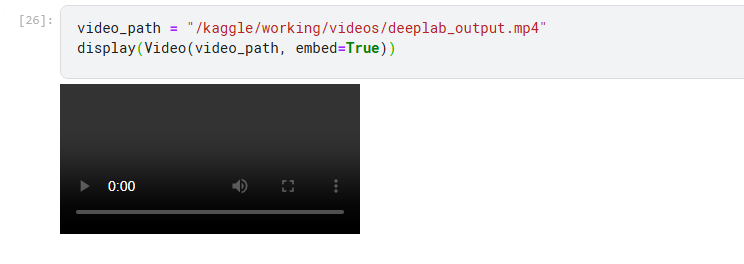

### ! Ссылка на диск, в котором лежат все используемые/полученные файлы, включая видео, находится в конце блокнота!

In [21]:
process_video(input_video_path, output_paths["segnet"], segnet_model, background_color)

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━

In [22]:
process_video(input_video_path, output_paths["unet"], unet_model, background_color)

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━

### Результаты
***

У U-net и Segnet более гладкий и точный контур сегментации, однако эти модели плохо справились с засвеченными кадрами и сегментировали много лишнего. В результате сегментации с помощью модели deeplab куда меньше ошибок.

На данном этапе можно сказать, что deeplab справилась лучше, но в дальнейшем обучении, как мне кажется, U-net и Segnet выдали бы лучшие результаты. 
***

Ссылка на все файлы используемые/полученные во время выполнения кода:
https://drive.google.com/drive/folders/1XTJMCnzLn7ZcXQokrp0J-SO2u0_QvNDR